# Visualing Spatial Data in Python: An very brief overview 

[**Michele Tizzoni** (@mtizzoni)](https://twitter.com/mtizzoni), <michele.tizzoni@isi.it>

[**Daniela Paolotti** (@danielapaolotti)](https://twitter.com/danielapaolotti), <daniela.paolotti@isi.it>

Most of the SDG indicators, along with development and humanitarian data, are georeferenced.

In this notebook we show how to deal with spatial data with Python with a specific focus on:
* loading and visualizing spatial data
* creating a map for a generic indicator at country level
* visualizing shapefiles

## Mapping in Python with geopandas

In [1]:
%matplotlib inline

import matplotlib
import matplotlib.pyplot as plt

from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

import geopandas as gpd
import pysal as ps

import seaborn as sns
from seaborn import palplot
import numpy as np

import pandas as pd


## Loading up spatial data 

The easiest way to get from a file to a quick visualization of the data is by loading it as a `GeoDataFrame` and calling the `plot` command. The main library employed for all of this is `geopandas` which is a geospatial extension of the `pandas` library, already introduced before. `geopandas` supports exactly the same functionality that `pandas` does (in fact since it is built on top of it, so most of the underlying machinery is pure `pandas`), plus a wide range of spatial counterparts that make manipulation and general "munging" of spatial data as easy as non-spatial tables.

In two lines of code, we will obtain a graphical representation of the spatial data contained in a file that can be in many formats.

Let us begin with the most common type of spatial data in the social science: **polygons**. 

For example, we can load the geography of the world with two lines of code.

In [2]:
path = gpd.datasets.get_path('naturalearth_lowres')
df_world = gpd.read_file(path)

In [3]:
df_world

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,28400000.0,Asia,Afghanistan,AFG,22270.0,"POLYGON ((61.21081709172574 35.65007233330923,..."
1,12799293.0,Africa,Angola,AGO,110300.0,(POLYGON ((16.32652835456705 -5.87747039146621...
2,3639453.0,Europe,Albania,ALB,21810.0,"POLYGON ((20.59024743010491 41.85540416113361,..."
3,4798491.0,Asia,United Arab Emirates,ARE,184300.0,"POLYGON ((51.57951867046327 24.24549713795111,..."
4,40913584.0,South America,Argentina,ARG,573900.0,(POLYGON ((-65.50000000000003 -55.199999999999...
5,2967004.0,Asia,Armenia,ARM,18770.0,"POLYGON ((43.58274580259273 41.09214325618257,..."
6,3802.0,Antarctica,Antarctica,ATA,760.4,(POLYGON ((-59.57209469261153 -80.040178725096...
7,140.0,Seven seas (open ocean),Fr. S. Antarctic Lands,ATF,16.0,"POLYGON ((68.935 -48.62500000000001, 69.58 -48..."
8,21262641.0,Oceania,Australia,AUS,800200.0,(POLYGON ((145.3979781434948 -40.7925485166058...
9,8210281.0,Europe,Austria,AUT,329500.0,"POLYGON ((16.97966678230404 48.12349701597631,..."


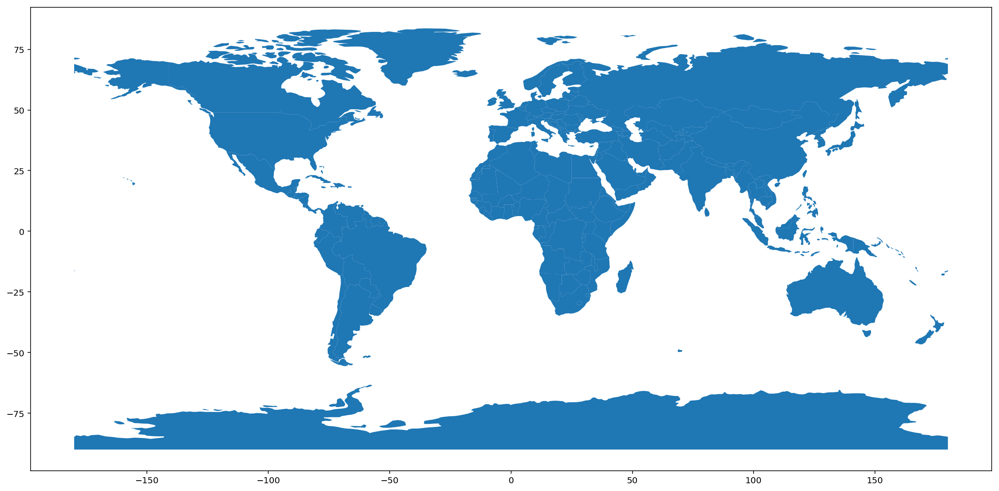

In [4]:
df_world.plot(figsize=(20,25))

If you call a single row of the `geometry` column, it'll return a small plot ith the shape:

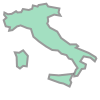

In [5]:
df_world.loc[79, 'geometry']

Other examples are available but of course this is not the end of the story.

In [6]:
gpd.datasets.available

['naturalearth_cities', 'naturalearth_lowres', 'nybb']

In [7]:
citypath=gpd.datasets.get_path('naturalearth_cities')

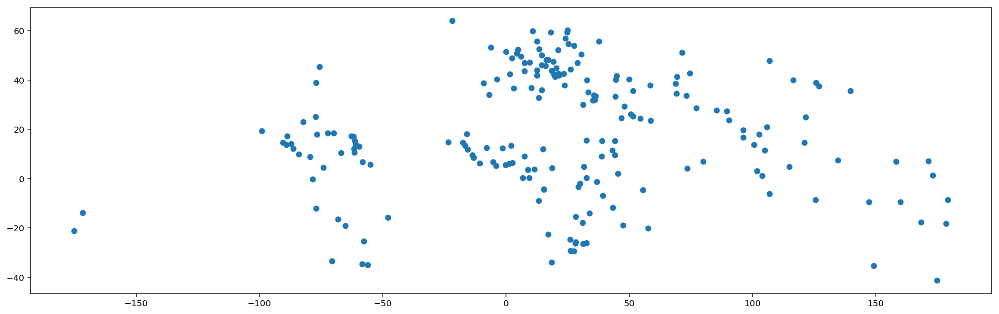

In [8]:
df_city = gpd.read_file(citypath)
df_city.plot(figsize=(20,25))

In [9]:
df_city

,name,geometry
0,Vatican City,POINT (12.45338654497177 41.90328217996012)
1,San Marino,POINT (12.44177015780014 43.936095834768)
2,Vaduz,POINT (9.516669472907267 47.13372377429357)
3,Luxembourg,POINT (6.130002806227083 49.61166037912108)
4,Palikir,POINT (158.1499743237623 6.916643696007725)
5,Majuro,POINT (171.3800001757465 7.103004311216239)
6,Funafuti,POINT (179.2166470940289 -8.516651999041073)
7,Melekeok,POINT (134.6265484669922 7.487396172977981)
8,Monaco,POINT (7.406913173465057 43.73964568785249)
9,Tarawa,POINT (173.0175708285494 1.338187505624603)


# Mapping our dataset
We map the gender equality index we created in the first notebook

In [10]:
df_gender=pd.read_csv('./../data/Gender_ratio_SL_DOM_TSPDCW.csv', index_col=0)

In [11]:
df_gender

,GeoAreaName,TimePeriod,Value_M,Value_F,Gender_ratio
0,Albania,2011.0,0.347080,2.187500,6.302582
1,Algeria,2012.0,0.833330,2.708330,3.250009
2,Argentina,2013.0,3.894250,9.692990,2.489052
3,Armenia,2008.0,0.582638,2.779860,4.771159
4,Australia,2006.0,2.013750,4.861250,2.414029
5,Austria,2009.0,1.224823,2.444701,1.995963
6,Belarus,2015.0,0.694580,2.222080,3.199171
7,Belgium,2013.0,0.859224,1.501310,1.747285
8,Bhutan,2015.0,0.972080,2.569580,2.643383
9,Brazil,2009.0,0.833330,2.708330,3.250009


In [12]:
df_gender=df_gender.rename(columns={'GeoAreaName':'name'})

In [13]:
pd.Series(list(set(df_gender.name).difference(set(df_world.name))))

0                                    State of Palestine
1                              United States of America
2                                     Republic of Korea
3                                   Republic of Moldova
4                      Lao People's Democratic Republic
5                                       North Macedonia
6                                               Réunion
7                            Iran (Islamic Republic of)
8                                             Mauritius
9                                    Russian Federation
10                                   Dominican Republic
11                          United Republic of Tanzania
12       China, Hong Kong Special Administrative Region
13    United Kingdom of Great Britain and Northern I...
14                                                Malta
dtype: object

In [14]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(pd.Series(list(set(df_world.name).difference(set(df_gender.name)))))

0                      Gambia
1                      Taiwan
2                      Uganda
3                 Puerto Rico
4                        Mali
5                        Togo
6                  Mauritania
7                  Czech Rep.
8                 Timor-Leste
9                   N. Cyprus
10                    Lao PDR
11                      India
12                Afghanistan
13            Dem. Rep. Korea
14                    Nigeria
15             United Kingdom
16       Central African Rep.
17                  Indonesia
18       United Arab Emirates
19                    Vietnam
20               Saudi Arabia
21                 Azerbaijan
22                 Somaliland
23             Dominican Rep.
24                      Nepal
25                    Iceland
26                    Myanmar
27                 Montenegro
28     Fr. S. Antarctic Lands
29                  Nicaragua
30                      Kenya
31                     Belize
32                    Lesotho
33        

In [15]:
df_gender['name'].replace({"Lao People's Democratic Republic":'Lao PDR',
                           "Iran (Islamic Republic of)":'Iran',
                           "Republic of Moldova":'Moldova',
                           "United Republic of Tanzania":'Tanzania',
                           "United States of America":'United States',
                           "North Macedonia":'Macedonia',
                           "Republic of Korea":'Korea',
                           "United Kingdom of Great Britain and Northern Ireland":'United Kingdom',
                           "Russian Federation":'Russia',
                           "State of Palestine":'Palestine'},inplace=True)

In [16]:
df_gender_world=df_world.merge(df_gender, on='name', how='inner')

In [17]:
df_gender_world

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,TimePeriod,Value_M,Value_F,Gender_ratio
0,3.639453e+06,Europe,Albania,ALB,21810.00,"POLYGON ((20.59024743010491 41.85540416113361,...",2011.0,0.347080,2.187500,6.302582
1,4.091358e+07,South America,Argentina,ARG,573900.00,(POLYGON ((-65.50000000000003 -55.199999999999...,2013.0,3.894250,9.692990,2.489052
2,2.967004e+06,Asia,Armenia,ARM,18770.00,"POLYGON ((43.58274580259273 41.09214325618257,...",2008.0,0.582638,2.779860,4.771159
3,2.126264e+07,Oceania,Australia,AUS,800200.00,(POLYGON ((145.3979781434948 -40.7925485166058...,2006.0,2.013750,4.861250,2.414029
4,8.210281e+06,Europe,Austria,AUT,329500.00,"POLYGON ((16.97966678230404 48.12349701597631,...",2009.0,1.224823,2.444701,1.995963
5,1.041434e+07,Europe,Belgium,BEL,389300.00,"POLYGON ((3.314971144228537 51.34578095153609,...",2013.0,0.859224,1.501310,1.747285
6,7.204687e+06,Europe,Bulgaria,BGR,93750.00,"POLYGON ((22.65714969248299 44.23492300066128,...",2010.0,0.347080,1.041670,3.001239
7,9.648533e+06,Europe,Belarus,BLR,114100.00,"POLYGON ((23.48412763844985 53.91249766704114,...",2015.0,0.694580,2.222080,3.199171
8,1.987393e+08,South America,Brazil,BRA,1993000.00,POLYGON ((-57.62513342958296 -30.2162948544542...,2009.0,0.833330,2.708330,3.250009
9,6.911410e+05,Asia,Bhutan,BTN,3524.00,"POLYGON ((91.69665652869668 27.77174184825166,...",2015.0,0.972080,2.569580,2.643383


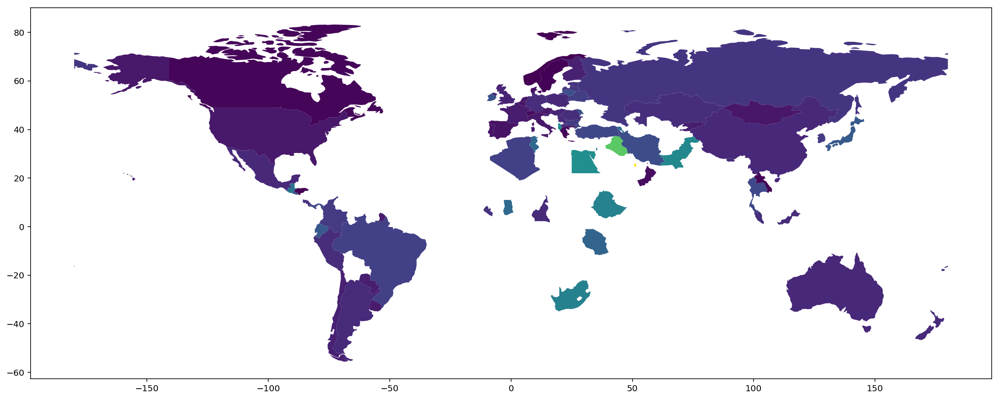

In [18]:
df_gender_world.plot(
    figsize=(20,25),
    column='Gender_ratio',
    cmap=plt.cm.viridis,     
)

It looks nice but we can add more details.

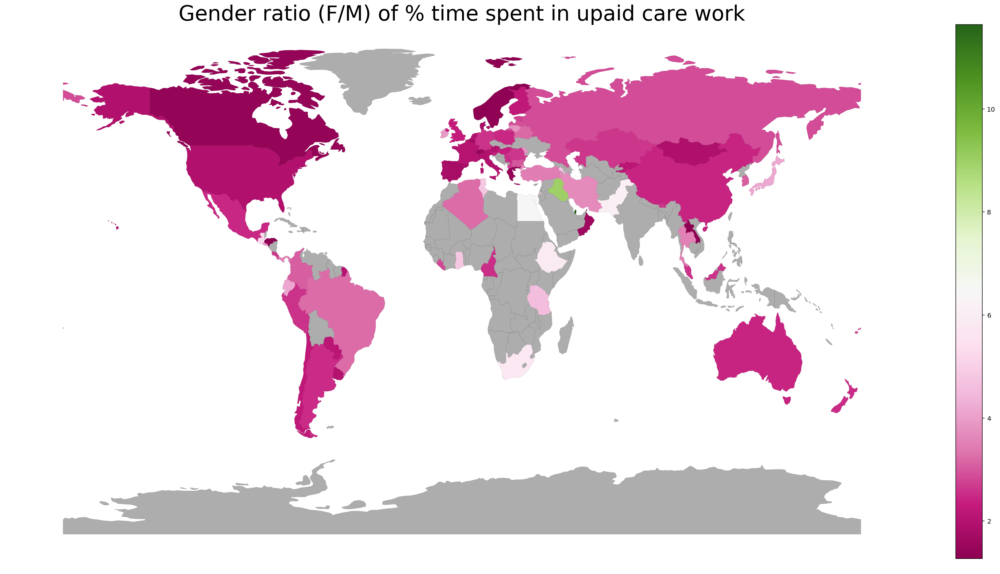

In [19]:
f, ax = plt.subplots(
    subplot_kw=dict(aspect='auto'))

f.set_figheight(15)
f.set_figwidth(30)

plt.title('Gender ratio (F/M) of % time spent in upaid care work', fontsize=32)

plt.axis('off')

df_world.plot(
    ax=ax,
    linewidth=0.1, 
    facecolor='#999999', 
    edgecolor='#111111', 
    alpha=0.8
)

df_gender_world.plot(
    ax=ax,
    column='Gender_ratio',
    cmap=plt.cm.PiYG,    
    legend=True,
)



# Working with shapefiles

The most common format used to work with geodatabases is ESRI shapefiles with extension *.shp

Geopandas can read various file formats of spatial data, including shapefiles.

We now pick an example from the thousands shapfiles available at https://data.humdata.org/

## DRC Health facilities in North Kivu

https://data.humdata.org/dataset/drc-health-facilities

The shapefile contains 2609 as of 9 Sept 2019 health structures in DRC (Included South Kivu) and from Goma (North Kivu) up to Ituri.

In [22]:
df_example=gpd.read_file('./../spatial/NK_IT_AOIEbola_StructuresAiresSante/NK_IT_AOIEbola_StructuresSanitaire_V12.shp')

In [23]:
df_example

,PAYS,PROVINCE,NOMZS,CODEZS,NOMAS,CODEAS,NOM,CODEHC,TYPE,EDITI_PAR,POINT_X,POINT_Y,OPERATIONE,SOURCE,STATUT,DATE,FIABILITE,geometry
0,RDC,NORD-KIVU,ALIMBONGO,612302,ALIMBANGO,61230201,CS ALIMBONGO,6123020009,CENTRE DE SANTE,OMS-DSNIS,29.150885,-0.366423,0.0,None,None,2018-12-29,BASSE,POINT (29.150885 -0.366423)
1,RDC,NORD-KIVU,ALIMBONGO,612302,BINGI,61230202,CSR BINGI,6123020010,CENTRE DE SANTE DE REFERENCE,OMS-DSNIS,29.083333,-0.400000,0.0,None,None,2018-12-29,BASSE,POINT (29.083333 -0.4)
2,RDC,NORD-KIVU,ALIMBONGO,612302,BUNYATENGE,61230203,CS BUNYATENGE,6123020012,CENTRE DE SANTE,OMS-DSNIS,28.848931,-0.449229,0.0,None,None,2018-12-29,BASSE,POINT (28.848931 -0.449229)
3,RDC,NORD-KIVU,ALIMBONGO,612302,BWATSINGE,61230202,CS BWATSINGE,6123020011,CENTRE DE SANTE,OMS-DSNIS,29.086250,-0.399583,0.0,None,None,2018-12-29,BASSE,POINT (29.08625 -0.399583)
4,RDC,NORD KIVU,ALIMBONGO,612302,CHECK BUYINGA,61230100,CS MUSUKU,None,CENTRE DE SANTE,OMS-DSNIS,28.900000,-0.216667,0.0,RGC,1,None,A VERIFIER,POINT (28.9 -0.216667)
5,RDC,NORD-KIVU,ALIMBONGO,612302,CHECK BUYINGA,61230100,CSR KASUGHO,None,CENTRE DE SANTE DE REFERENCE,OMS-DSNIS,28.962300,-0.158730,0.0,None,None,2018-12-29,TRES BAS,POINT (28.9623 -0.15873)
6,RDC,NORD-KIVU,ALIMBONGO,612302,CHECK BUYINGA,61230100,CS KASABINYOLE,None,CENTRE DE SANTE,OMS-DSNIS,28.666667,-0.383333,0.0,None,None,2018-12-29,TRES BAS,POINT (28.666667 -0.383333)
7,RDC,NORD-KIVU,ALIMBONGO,612302,CHECK BUYINGA,61230100,CS NGENGERE,None,CENTRE DE SANTE,OMS-DSNIS,28.633333,-0.116667,0.0,None,None,2018-12-29,TRES BAS,POINT (28.633333 -0.116667)
8,RDC,NORD-KIVU,ALIMBONGO,612302,CHECK BUYINGA,61230100,PS NGELE,None,POSTE DE SANTE,OMS-DSNIS,28.633333,-0.116667,0.0,None,None,2018-12-29,A VERIFIER,POINT (28.633333 -0.116667)
9,RDC,NORD-KIVU,ALIMBONGO,612302,CHECK BUYINGA,61230100,CS KYANGIKE,None,CENTRE DE SANTE,OMS-DSNIS,28.766667,-0.250000,0.0,None,None,2018-12-29,A VERIFIER,POINT (28.766667 -0.25)


In [40]:
df_example.columns

Index(['PAYS', 'PROVINCE', 'NOMZS', 'CODEZS', 'NOMAS', 'CODEAS', 'NOM',
       'CODEHC', 'TYPE', 'EDITI_PAR', 'POINT_X', 'POINT_Y', 'OPERATIONE',
       'SOURCE', 'STATUT', 'DATE', 'FIABILITE', 'geometry'],
      dtype='object')

Geopandas allows visualizing a shapefile with a map background, taken from OpenStreetMap

In [24]:
import contextily as ctx

def add_basemap(ax, zoom, url='http://tile.stamen.com/terrain/tileZ/tileX/tileY.png'):
    xmin, xmax, ymin, ymax = ax.axis()
    basemap, extent = ctx.bounds2img(xmin, ymin, xmax, ymax, zoom=zoom, url=url)
    ax.imshow(basemap, extent=extent, interpolation='bilinear')
    # restore original x/y limits
    ax.axis((xmin, xmax, ymin, ymax))

To overlay our shapefile on a map we need to change projection of our dataset, using the [Web Mercator](https://en.wikipedia.org/wiki/Web_Mercator_projection) projection.

In [25]:
df_example = df_example.to_crs(epsg=3857)

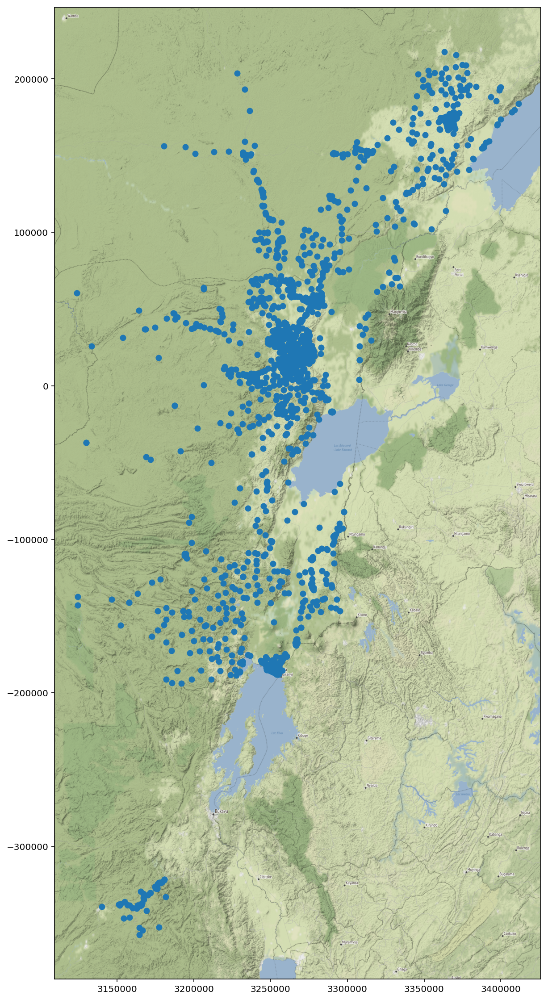

In [26]:
ax1=df_example.plot(figsize=(10,20))
add_basemap(ax1, zoom=10)

In Python, thanks to geopandas, creating categorical choropleths is possible with one line of code. To demonstrate this, we can plot the spatial distribution of health facilities colored according to their reliability (FIABILITE) level.

In [33]:
df_example.FIABILITE.unique()

array(['BASSE', 'A VERIFIER', 'TRES BAS', 'HAUTE', 'MOYENNE', None,
       'NULL', 'TRES HAUTE', 'HAUT'], dtype=object)

In [36]:
df_example.replace({'FIABILITE': {None:'NONE'}}, inplace=True)

In [37]:
df_example.FIABILITE.unique()

array(['BASSE', 'A VERIFIER', 'TRES BAS', 'HAUTE', 'MOYENNE', 'NONE',
       'NULL', 'TRES HAUTE', 'HAUT'], dtype=object)

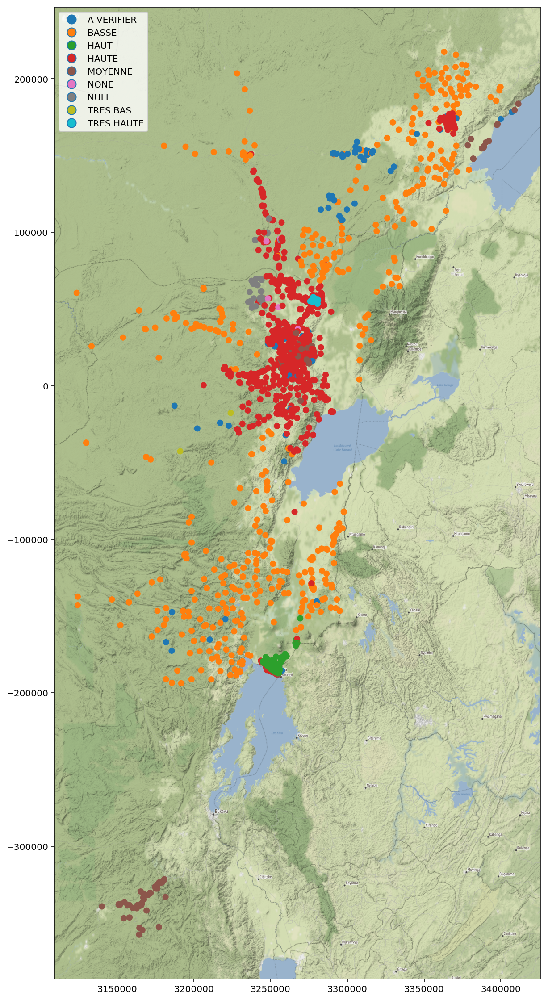

In [39]:
ax1=df_example.plot(
    figsize=(10,20),
    column='FIABILITE',
    categorical=True,
    legend=True
)

add_basemap(ax1, zoom=10)

# Zooming into the map

A general map of an entire region, or urban area, can sometimes obscure particularly local patterns because they happen at a much smaller scale that cannot be perceived in the global view. One way to solve this is by providing a focus of a smaller part of the map in a separate figure. Although there are many ways to do this in Python, the most straightforward one is to reset the limits of the axes to center them in the area of interest.



(3250000, 3300000)

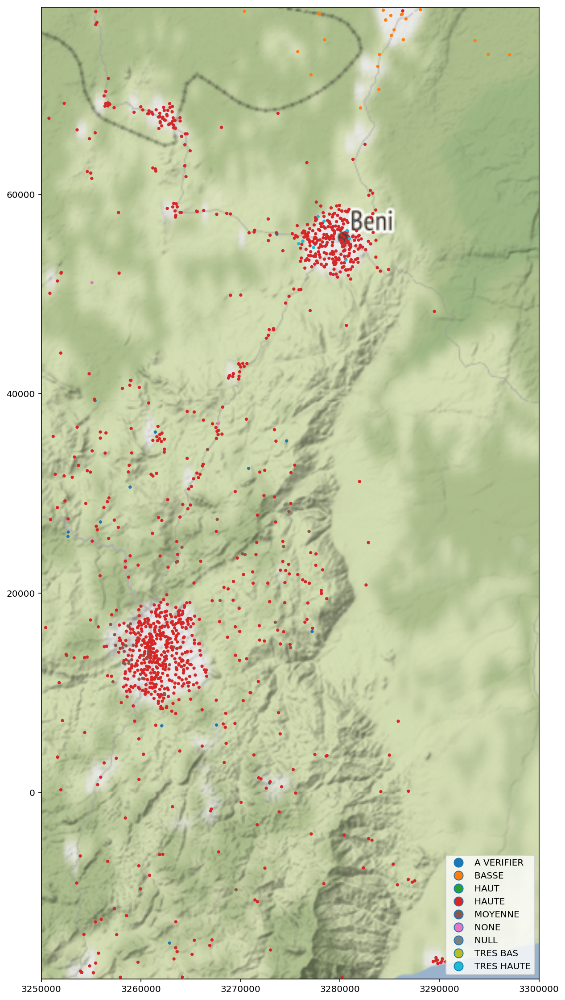

In [50]:
ax1=df_example.plot(
    figsize=(10,20),
    column='FIABILITE',
    markersize=7,
    categorical=True,
    legend=True
)
add_basemap(ax1, zoom=10)

plt.axis('equal')

ax1.set_ylim(20000, 40000)
ax1.set_xlim(3250000, 3300000)

